# **Learning the Wheel**

The colab notebook serves as an interactive demonstration of the instrument timbre manipulation system described in the ECS7022P project paper *Learning the Wheel* by Nick Reeves

The project demonstrates a method for modulating between DDSP based neural instrument models (Engel et al., 2020). The workbook is designed to allow the user to create their own "modulation wheel" that can navigate the space between set of instrument tones. The dial is created by using a simple three layered neural network and the instrument tones are synthesized using pre-trained models provided by [Engel et al.](https://colab.research.google.com/github/magenta/ddsp/blob/main/ddsp/colab/demos/timbre_transfer.ipynb)

# **Setup**

Due to package compatibility issues in the default colab enviornment, some of the packages require updates for the code to run. The following block performs all the installations and updates.

All operations other than pre-processing are light-weight so it is reccomended to run the notebook on a CPU to avoid a pre-mature end to the runtime. If the runtime is deleted, this step will need to run again.

In [ ]:
#package version control
print('Downloading Compatible Keras, TF, and TFP Versions') #--quiet
!pip install keras==2.11.0 --quiet
!pip install tf-keras==2.14.1 --quiet
!pip install tensorflow==2.11.1 --quiet
!pip install tensorflow_probability==0.19.0 --quiet

print('Downloading DDSP')
!pip install ddsp==3.6.0 --quiet

print('Downloading Dash and Jupyter-Dash')
!pip install dash --quiet
!pip install jupyter-dash --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 12.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0 requires keras<2.16,>=2.15.0, but you have keras 2.11.0 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 588.3/588.3 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 439.2/439.2 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 21.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.3/781.3 kB 12.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are insta

Once downloaded, run the following cell to restart the runtime. This is required to use the updates in the current session.

In [ ]:
#restart RunTime
import os
os.kill(os.getpid(), 9)

Now the packages can be imported

In [ ]:
from google.colab import files
import warnings
warnings.filterwarnings("ignore")

from IPython.display import Audio, display
import ipywidgets as widg
from ipywidgets import interact, FloatSlider, Button, Output, HBox
import dash
import plotly.graph_objects as go
from dash import html, dcc, Input, Output, State

import librosa
import matplotlib.pyplot as plt
import numpy as np
import pickle
import gin
import types
import os
import time
from scipy.interpolate import interp1d
import random

import tensorflow.compat.v2 as tf
import tensorflow.compat.v2.keras as tfk

import ddsp
from ddsp import dags, synths, effects, core, training, processors, losses
from ddsp.training.models import autoencoder

from google.colab import output
output.enable_custom_widget_manager()

# Helper Functions

## General Functions

The following functions and objects are used at various stages of the notebook to aid with data manipulation and visualtion

In [ ]:
#@markdown Modified code from ECS7013 Deep Learning for Audio Lab used to plot spectrogram
def spec_plot(audio, sr, title='', n_fft=2048, hop_length=512):
  audio = audio.squeeze() if len(audio.shape) > 1 else audio

  X = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length)
  S = librosa.amplitude_to_db(abs(X))

  plt.figure(figsize=(10, 3))
  ax = plt.subplot(111)

  img = librosa.display.specshow(S
                                 ,sr=sr
                                 ,hop_length=hop_length
                                 ,x_axis='time'
                                 ,y_axis='linear'
                                 ,cmap='jet'
                                 ,ax=ax)
  plt.colorbar(img, format='%+2.0f dB', ax=ax)
  plt.title(title)
  plt.show()

In [ ]:
#@markdown Function that cleans user drawn paths in plotly dashboards and converts them to a sorted list of x and y coordinates.
#@markdown This function is used during the parameter automation step
def clean_paths(paths):
  cleaned_coordinates = []
  for path_obj in paths:
    path_str = path_obj['path']
    path_str = path_str.replace('M','')
    path_split = path_str.split('L')
    for i, point_str in enumerate(path_split):
      cords_str = point_str.split(',')
      cords_flt = [float(cords_str[0]), float(cords_str[1])]
      cleaned_coordinates.append(cords_flt)

  cleaned_coordinates = sorted(cleaned_coordinates, key=lambda x: x[0])

  return cleaned_coordinates

In [ ]:
#@markdown Replaces nan values in a numpy file and replaces them with the nearest non-nan value.
#@markdown Additionally, sets any values below zero to zero and values above 1 to 1
def nan_to_num(arr):
  arr = np.clip(arr, 0, 1)
  not_nan = np.where(~np.isnan(arr))[0]

  #if no nans return input
  if not_nan.shape[0] == 0:
    return arr
  else:
    #iterate forward replacing nan values with prior value
    for i, val in enumerate(arr):
      if np.isnan(val) and i > 0:
        arr[i] = arr[i-1]

    #iterate backwards through array replacing values with value after
    for i in range(arr.shape[0]):
      ind = -(i+1)
      val = arr[ind]
      if np.isnan(val) and ind < -1:
        arr[ind] = arr[ind+1]
    return arr


## DDSP Functions

The following functions are used to load the pre-trained models and generate sound.

In [ ]:
#@markdown The ddsp models are configured using gin files that specify model hyperparameters.
#@markdown Some of these hyperparameters are dependent on the audio that is fed into it. This function makes those adjustments.

def update_gin(audio):
    #used to update gin files that specify model parameters for the pre trained instruments based on input audio
    #trims the vectors representing audio features based on model parameters and sets fft parameters equal to values stored in model
    time_steps_train = gin.query_parameter('F0LoudnessPreprocessor.time_steps')
    n_samples_train = gin.query_parameter('Harmonic.n_samples')
    hop_size = int(n_samples_train / time_steps_train)

    time_steps = int(audio.shape[1] / hop_size)
    n_samples = time_steps * hop_size

    gin_params = [
        'Harmonic.n_samples = {}'.format(n_samples),
        'FilteredNoise.n_samples = {}'.format(n_samples),
        'F0LoudnessPreprocessor.time_steps = {}'.format(time_steps),
        'oscillator_bank.use_angular_cumsum = True',
    ]
    with gin.unlock_config():
      gin.parse_config(gin_params)

    return n_samples, time_steps

In [ ]:
#@markdown The DDSP models leverage a directed acyclic graph of DSP operators to synthesize audio.
#@markdown Instead of learning to produce audio directly, the models learn to synthesis parameters for the DSP nodes in the DAG which produce sound.
#@markdown The following function extracts the hyperparameters sepcifying the design of the DAG from the current .gin file and returns its configuration.

def build_dag_config():
    #update processor unit configurable to object with parameters in GIN config
    config = gin.config._CONFIG
    pg_dag = gin.query_parameter('ProcessorGroup.dag').copy()

    for i,node in enumerate(pg_dag):
        proc_key = node[0].config_key
        proc_params = config.get(proc_key)

        #getting scaling function configurable and replace as object
        sc_fn = proc_params.get('scale_fn')
        if sc_fn is not None and not isinstance(sc_fn,types.FunctionType):
            sc_fn = sc_fn.__deepcopy__({})
            proc_params['scale_fn'] = sc_fn
            #only need exp_sig_params if they differ across models
            #exp_sig_params = config.get(('', 'ddsp.core.exp_sigmoid'))

        #create relevant processor unit
        if proc_key[1] == 'ddsp.synths.Harmonic':
            proc_unit = synths.Harmonic(**proc_params)
        elif proc_key[1] == 'ddsp.synths.FilteredNoise':
            proc_unit =  synths.FilteredNoise(**proc_params)
        elif proc_key[1] == 'ddsp.processors.Add':
            proc_unit = processors.Add(**proc_params)
        elif proc_key[1] == 'ddsp.effects.Reverb':
            proc_unit = effects.Reverb(**proc_params)

        #update processor group dag with processor objects
        new_node = (proc_unit, node[1])
        pg_dag[i] = new_node

    return pg_dag

In [ ]:
#@markdown Helper function used to build the auto encoder

def create_ae_comp(key, params):
    obj_name = key[1]

    if obj_name == 'ddsp.losses.SpectralLoss':
        new_obj = losses.SpectralLoss(**params)
    elif obj_name == 'ddsp.training.decoders.RnnFcDecoder':
        new_obj = training.decoders.RnnFcDecoder(**params)
    elif obj_name == 'ddsp.training.preprocessing.F0LoudnessPreprocessor':
        new_obj = training.preprocessing.F0LoudnessPreprocessor(**params)

    return new_obj

In [ ]:
#@markdown Audio is fed into the model by extracting its fundamental and loudness at each time step.
#@markdown The autoencoder converts these audio features and into a set of controls for the DSP operators in the DAG.
#@markdown The controls are then decoded to produce the output audio.
#@markdown 'build_ae()' is used to construct the autoencoder based on the processor group containing the DSP nodes

def build_ae_config(proc_gr):
    #build objects used in autoencoder and store in ae_dict
    ae_dict = {}

    #load dictionary for config and autoencoder parameters
    config = gin.config._CONFIG
    ae_params = config[('', 'ddsp.training.models.Autoencoder')].copy()

    #add preconstructed processor group object to AE object dictionary
    #and remove key from AE parameters
    if ae_params.get('processor_group') is not None:
        ae_params.pop('processor_group')
        ae_dict['processor_group'] = proc_gr

    #iterate through AE components.
    for key_ae in ae_params:
        ae_obj = ae_params[key_ae]
        if isinstance(ae_obj,list):
            ae_obj_init = []
            for sub_obj in ae_obj:
                config_key = sub_obj.config_key
                params = config[config_key]
                sub_obj_init = create_ae_comp(config_key,params)
                ae_obj_init.append(sub_obj_init)
            ae_dict[key_ae] = ae_obj_init

        elif ae_obj is not None:
            config_key = ae_obj.config_key
            params = config[config_key]
            init_obj = create_ae_comp(config_key,params)
            ae_dict[key_ae] = init_obj

        else:
            ae_dict[key_ae] = None

    return ae_dict

In [ ]:
#@markdown The following function takes in a set of operator controls and a processor group and returns a dictionary containing the output signal.
#@markdown The decoder in the auto encoder produces controls for a harmonic synthesizer, noise synthesizer based on the fundamental and loudness.
#@markdown The decoder learns the relationship between these audio features and the synthesizer controls and represents the difference between instrument sounds.

def run_dag(inputs, pg, verbose=False):
    #take input audio features and processor group and returns
    #output dictionary with signal

    #Reminants from source DDSP repository linked in introduction
    #kept for congruency
    is_loss = lambda v: hasattr(v, 'get_losses_dict')
    is_processor = lambda v: hasattr(v, 'get_signal') and hasattr(v, 'get_controls')

    outputs = {'inputs': inputs}
    outputs.update(inputs)
    # Run through the DAG nodes in sequential order.
    for node in pg.dag:
        #The first element of the node can be either a module or module_key.
        module_key, input_keys = node[0], node[1]
        module = getattr(pg, module_key)
        # Optionally specify output keys if module does not return dict.
        output_keys = node[2] if len(node) > 2 else None

        # Get the inputs to the node, using nested lookup through audio features dict
        inputs = [core.nested_lookup(key, outputs) for key in input_keys]
        if verbose:
            shape = lambda d: tf.nest.map_structure(lambda x: list(x.shape), d)
            print('Input to Module: {0}\nKeys: {1}\nIn: {2}\n'.format(
                         module_key, input_keys, shape(inputs)))

        if is_processor(module):
            module_outputs = module(*inputs, return_outputs_dict=True )
        elif is_loss(module):
            # Loss modules.
            module_outputs = module.get_losses_dict(*inputs)
        else:
            # Network modules.
            module_outputs = module(*inputs)

        if not isinstance(module_outputs, dict):
            print(output_keys)
            module_outputs = core.to_dict(module_outputs, output_keys)

        if verbose:
            print('Output from Module: {0}\nOut: {1}\n'.format(
                         module_key, shape(module_outputs)))

      # Add module outputs to the dictionary
        outputs[module_key] = module_outputs

    outputs['out'] = module_outputs

    return outputs

## Network Bending

The project explores a few methods of generating instrument sounds to add diversity to the tones that you can modulate between. (Yee-King et al., 2021) explored the use of network bending tecniques as inspired by (Broad et al., 2020) with DDSP models to produce novel instrument timbres. This project borrows heaviliy from [their repository](https://github.com/yeeking/ddsp-experiments/) to leverage a few of the bending methods they considered.

In [ ]:
#@markdown The networkbender object recieves parameters and applies a function to intermediate activation values
#@markdown produced when the autoencoder converts audio features to DSP parameters.

#@markdown Ablation sets a random sample of network activations to zero and inversion multiplies the activations by -1.

#@markdown This implimentation of thresholding modifies the method proposed by Yee-King to be frame relative.
#@markdown A threshold is set for each frame based on the 0-1 valued threshold parameter and the minimum and maximum value of the activations at that hop.
#@markdown Values that fall below the threshold are set to the minimum value and values greater than the threshold are set to the maximum.

class NetworkBender():
  def __init__(self, random_state=0):
    self.random_state = random_state

  def sample_acts(self, pool_size, sample_per=0):
    #returns N randonly selected activation indices
    np.random.seed(self.random_state)
    ind = np.arange(pool_size)
    num_samples = int(sample_per*pool_size)
    samp_ind = np.random.choice(ind ,size=num_samples, replace='False')
    return samp_ind

  def ablate(self, acts, per=1):
    acts = acts.numpy()
    acts = acts.reshape((acts.shape[1], acts.shape[2]))
    frames, num_outs = acts.shape

    #randomly select fraction of the neurons to ablate
    abl_act_ind = self.sample_acts(num_outs,per)

    acts[:,abl_act_ind] = 0
    return acts.reshape((1, frames, num_outs))

  def invert(self, acts, per=1):
    #invert the activation values
    acts = acts.numpy()
    acts = acts.reshape((acts.shape[1], acts.shape[2]))
    frames, num_outs = acts.shape

    inv_act_ind = self.sample_acts(num_outs,per)
    acts[:,inv_act_ind] = -1* acts[:,inv_act_ind]
    return acts.reshape((1, frames, num_outs))

  def threshold(self, acts, per=1, th = 1):
    #apply threshold over frames to each activation dim
    acts = acts.numpy()
    acts = acts.reshape((acts.shape[1], acts.shape[2]))
    frames, num_outs = acts.shape
    acts = acts.reshape((frames, num_outs))

    #slice of activations to be bended
    th_act_ind = self.sample_acts(num_outs, per)
    acts_slice = acts[:,th_act_ind]

    #scaling the threshold based on the frame
    frame_maxes = np.max(acts_slice, axis=1).reshape((-1,1))
    frame_mins = np.min(acts_slice, axis=1).reshape((-1,1))
    th_v = frame_mins + th*(frame_maxes - frame_mins)

    #create 0 1 grid based on threshold condition applied
    #to full activation array
    acts_th_full = (acts >= th_v)

    #create array of dim = act.shape so that activations above threshold
    #have the max framewise activation value and activations below threshold
    #have the min framewise activation value
    max_acts_full = np.ones_like(acts) * frame_maxes
    min_acts_full = np.ones_like(acts) * frame_mins

    acts_th_vals = acts_th_full*(max_acts_full - min_acts_full) + min_acts_full

    #replace selected neuron acivations with the updated frame maxes/mins
    acts[:,th_act_ind] = acts_th_vals[:,th_act_ind]

    return acts.reshape((1, frames, num_outs))

  def apply_bending(self, bend_type, acts, per=1, th=.5):
    if bend_type == 'ablate':
      output = self.ablate(acts, per)
    elif bend_type == 'invert':
      output = self.invert(acts, per)
    elif bend_type == 'threshold':
      output = self.threshold(acts, per, th)
    else:
      print('No valid bend type provided')
      output = acts
    return output


In [ ]:
#@markdown The following function replicates the abstracted decoder in the autoencoder with a Network Bending object inserted.

def run_decoder(decoder, position, bend_type, per, th, *inputs):
    #create network bender
    NetBend = NetworkBender()

    inputs = list(inputs)
    # Last input is always carried state for stateless RNN.
    if decoder.stateless:
      state = inputs.pop()

    #iterates over ('ld_scaled', 'f0_scaled') tensors and feeds them into
    #a nn.FcStack object
    #each nn.FcStack inherits from tf.keras.sequential and is made up
    #of a list of layers input is passed through in sequence
    #each layer is made up of , tf.keras.dense, tf.keras.layer_normalization,

    #each input dim is (1, num_frames, 1)
    #out from the MLPs are (1, num_frames, ch in gin (512) )
    inputs = [stack(x) for stack, x in zip(decoder.input_stacks, inputs)]

    #network bend loc: F0 MLP or ld MLP
    if position == '1':
      inputs[0] = NetBend.apply_bending(bend_type, inputs[0], per, th)
      inputs[1] = NetBend.apply_bending(bend_type, inputs[1], per, th)

    # concat out of stacks: dim (1,n_frames,1024)
    x = tf.concat(inputs, axis=-1)

    #network bend loc: both F0 and loud MLP
    if position == '2':
      inputs[0] = NetBend.apply_bending(bend_type, inputs[0], per, th)
      inputs[1] = NetBend.apply_bending(bend_type, inputs[1], per, th)

    #concated MLP output passed through RNN: out dim: (1, n_frames, 512)
    if decoder.stateless:
        x, new_state = decoder.rnn(x, state)
    else:
        x = decoder.rnn(x)

    #net bend location: RNN only
    if position == '3':
      x = NetBend.apply_bending(bend_type, x, per, th)

    #concat out of RNN to original out from first set of layers
    #out_dim (1,n_frames, 1536)
    x = tf.concat(inputs + [x], axis=-1)

    #Net Bend Location # RNN and both MLPs
    if position == '4':
      x = NetBend.apply_bending(bend_type, x, per, th)

    #MLP applied to concatenated set of outs: out dim: (1, n_frames, 512)
    x = decoder.out_stack(x)

    #Net Bend location # RNN and both MLPs
    if position == '5':
      x = NetBend.apply_bending(bend_type, x, per, th)

    #dense out, out dim is equal to (1, num_frames, sum of number of parameters in the controls)
    #first neuron out is amplitude param, 2-61 are harmonic dist params, 62-126 are filtered noise params
    x = decoder.dense_out(x)

    output_dict = training.nn.split_to_dict(x, decoder.output_splits)
    if decoder.stateless:
      output_dict['state'] = new_state

    return output_dict

In [ ]:
#@markdown Shell function to run the network bended AE decoder. Modified code from the ddsp repository
#@markdown https://github.com/magenta/ddsp/tree/main

def decode_controls(decoder, position, bend_type, per, th, *inputs):
    #converts input dict of audio features to list of inputs based
    #on decoder input keys specified in .gin
    #passes this list to tf.keras.layers.Layer.__call__ to get outputs
    #corresponds to __call__ in ddsp.training.nn.DictLayer

    # inputs var is a tuple (with one element) equal to the dictionary
    #of audio features. loop converts to dict
    input_dict = {}
    for v in inputs:
        if isinstance(v, dict):
            input_dict.update(v)

    # For all non dictionaries, add to input list.
    # Assumes that any non dictionary given as input will be used by decoder
    inputs = [v for v in inputs if not isinstance(v, dict)]

    # Add tensors contained in input audio features to input list
    #if they are defined as decoder inputs in the order specified in .gin
    for key in decoder.input_keys:
        inputs.append(core.nested_lookup(key, input_dict))

    #outputs are made by passing input list into tf.keras.layers.layer
    outputs = run_decoder(decoder, position, bend_type, per, th, *inputs)

    return outputs

## Progress Tracker

In [ ]:
#@markdown The progress tracker is used to store the paths to models, retrieve them, and store instrument presets created in further sections of the notebook.

class ProgressTracker:
  def __init__(self, source_audio, source_sr):
    self.source_audio = source_audio
    self.source_sr = source_sr

    #extracts fundamental and loudness by time step for source
    ddsp.spectral_ops.reset_crepe()
    self.source_features = ddsp.training.metrics.compute_audio_features(self.source_audio)
    for k, v in self.source_features.items():
      if tf.is_tensor(v):
          self.source_features[k] = v.numpy()

    self.valid_instruments = ['violin', 'flute', 'flute2', 'trumpet', 'tenor_saxophone']
    self.instruments= {} #dictionary of dictionaries with format instrument name: {gin:path/to/model/gin, ckpt:path/to/model/ckpt, pg:procgroup, ae:autoencoder  }

    self.saved_outputs={} #stores sounds to be used in

  #reverb settings are learned for each instrument, so reverb can be adjusted by changing the gin
  #as the core components of the models are built seperately, this function allows the user to alter reverb settings for all outputs
  def set_reverb(self,inst_name):
    if inst_name not in self.valid_instruments:
        print("Not a valid instrument name. Reverb settings are sourced from the models \Choose from violin, flute, flute2, trumpet, tenor_saxophone")
    else:
      paths = self.instruments[inst_name]
      with gin.unlock_config():
        gin.parse_config_file(paths['gin'], skip_unknown=True)

  #copies pretrained model ckpts and .gin files to workspace
  def load_inst(self,inst_name):
    if inst_name not in self.valid_instruments:
        print("Not a valid instrument name. \Choose from violin, flute, flute2, trumpet, tenor_saxophone")
    else:
      print('Loading: {}'.format(inst_name))
      copy_dir = os.path.join('/content/pretrained',inst_name)
      ckpt_dir = 'gs://ddsp/models/timbre_transfer_colab/2021-07-08' #location of the pre-trained models
      model_dir = os.path.join(ckpt_dir, 'solo_{}_ckpt'.format(inst_name) )
      !rm -r $copy_dir &> /dev/null
      !mkdir -p $copy_dir &> /dev/null
      !gsutil cp $model_dir/* $copy_dir &> /dev/null
      print('copied {0} model from {1} to {2}'.format(inst_name
                                                      ,model_dir
                                                      ,copy_dir))

      #find ckpt name from .index
      ckpt_name = ''
      for filename in os.listdir(copy_dir):
          if filename[-6:] == '.index':
              ckpt_name = filename[:-6]

      gin_path = os.path.join(copy_dir, 'operative_config-0.gin')
      ckpt_path = os.path.join(copy_dir, ckpt_name)
      self.instruments[inst_name] = {'gin':gin_path , 'ckpt':ckpt_path }

  #constructs the model processor group and autoencoder using .gin and ckpt
  def build_instrument(self, inst_name):
    paths = self.instruments[inst_name]
    with gin.unlock_config():
      gin.parse_config_file(paths['gin'], skip_unknown=True)

    n_samples, time_steps = update_gin(self.source_features['audio'])
    for key in ['f0_hz', 'f0_confidence', 'loudness_db']:
      self.source_features[key] = self.source_features[key][:time_steps]
      self.source_features['audio'] = self.source_features['audio'][:,:n_samples]

    dag_config = build_dag_config()
    processor_group = processors.ProcessorGroup(dag_config)
    ae_config = build_ae_config(processor_group)
    auto_encoder = autoencoder.Autoencoder(**ae_config)
    auto_encoder.restore(paths['ckpt'])

    self.instruments[inst_name]['pg'] = processor_group
    self.instruments[inst_name]['ae'] = auto_encoder

  def get_instrument(self, inst_name):
    if inst_name not in list(self.instruments.keys()):
      self.load_inst(inst_name)
      self.build_instrument(inst_name)

    processor_group = self.instruments[inst_name]['pg']
    auto_encoder = self.instruments[inst_name]['ae']
    return {'pg':processor_group, 'ae': auto_encoder }

  def save_output(self, output, setting_name):
    self.saved_outputs[setting_name] = output
    print('Output Saved: {}'.format(setting_name))

# Load Melody and Basic Timbre Transfer

To start, we begin by loading an audio file and performing some basic timbre transfer to showcase the capabilities of the DDSP models. The source audio needs to a single channel mp3 or wav file. The models are trained to handle monophonic melodies.

After loading a file, a project tracker object is intialized to contain any models built or presets you would like to use in the final parameter. When initialized, the tracker extracts predictions for the framewise fundamental frequencies and loudness. This step can take around ten minutes for a 30 second audio clip.

**The preprocessing step is the longest in the notebook**

Saving test_audio.wav to test_audio.wav


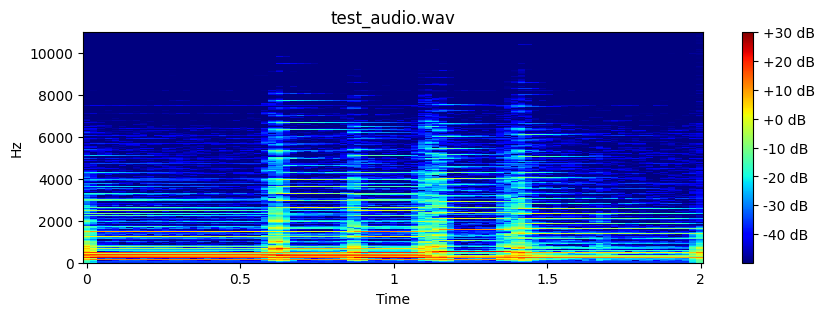

In [ ]:
results = files.upload()
filename_list = list(results.keys())

if len(filename_list) != 1 or filename_list[0][-4:] not in ['.wav', '.mp3']:
  print('Please upload a single file with type .mp3 or .wav')
else:
  upload_filename = filename_list[0]
  audio, sample_rate = librosa.load(upload_filename)
  audio = np.expand_dims(audio, axis=0)
  display(Audio(audio, rate=sample_rate))
  spec_plot(audio, sample_rate, title=upload_filename)
  tracker = ProgressTracker(audio, sample_rate)


Loading: flute2
copied flute2 model from gs://ddsp/models/timbre_transfer_colab/2021-07-08/solo_flute2_ckpt to /content/pretrained/flute2


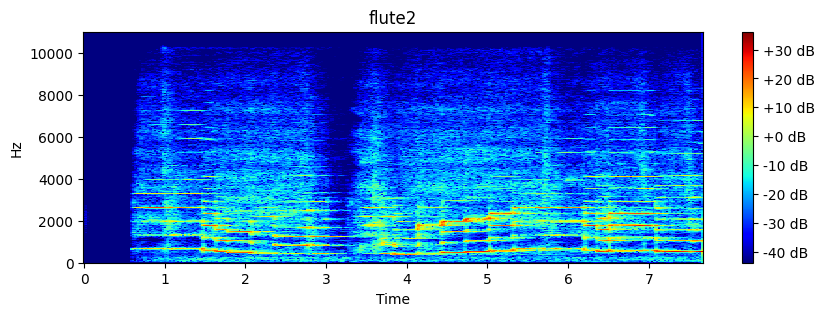

In [ ]:
#@markdown Now lets perform some basic timbre transfer using the pre-trained models.
#@markdown select an instrument using the dropdown and hit run to hear how the input sounds resynthesized with the timbre of the selected instrument

instrument_type = 'flute2' #@param ['violin', 'flute', 'flute2', 'trumpet', 'tenor_saxophone']

#get model
model = tracker.get_instrument(instrument_type)
aut_enc = model['ae']
processor_group = model['pg']

#additional preprocessing
inst_controls = tracker.source_features.copy()
inst_controls = aut_enc.encode(inst_controls)

#get DSP controls
dec_controls = aut_enc.decoder(inst_controls)
inst_controls.update(dec_controls)

#synthesize Audio
output = run_dag(inst_controls, processor_group)
output_audio = output['out']['signal']

display(Audio(output_audio, rate=sample_rate))
spec_plot(output_audio.numpy(), sample_rate, title=instrument_type)

The tracker stores any outputs that you wish to include in the final parameter. You can think of each output as a potential position on a modulation wheel for a synthesizer.

If you want to include the output from the previous cell in your parameter, run the following code cell. The cell can be re-run  multiple times at each stage instruments. There is a section later in the notebook dedicated to deleting any unwanted sounds.

In [ ]:
setting_name = 'Basic Flute' #@param {type:"string"}

tracker.save_output(output, setting_name)

Output Saved: Basic Flute


# Instrument Weighting and Transitions

The instrument models all synthesize audio by learning the relationship between the fundamental frequency and loudness of an input and the parameters of both a harmonic synthesizer and a filtered noise synthesizer. The models also learn the parameters of a reverberation effect, however this of less interest for the topic of timbral manipulation.

The synthesizers used to produce the audio are the same for each model so we can create new instrument tones by weighting the parameters produced by the different networks. For example, we could create an instrument tone with harmonic qualities of a violin and the noise qualities of flute by using the harmonic synthesizer controls from the violin model and noise synthesizer controls from the flute model.

## Weighting

Loading: violin
copied violin model from gs://ddsp/models/timbre_transfer_colab/2021-07-08/solo_violin_ckpt to /content/pretrained/violin
Loading: tenor_saxophone
copied tenor_saxophone model from gs://ddsp/models/timbre_transfer_colab/2021-07-08/solo_tenor_saxophone_ckpt to /content/pretrained/tenor_saxophone


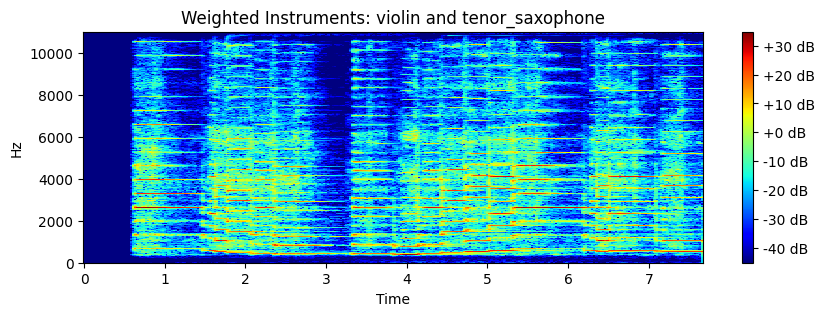

In [ ]:
#@markdown Select the instruments you would like to use as the basis for the new tone.

instrument_1_type = 'violin' #@param ['violin', 'flute', 'flute2', 'trumpet', 'tenor_saxophone']
instrument_2_type = 'tenor_saxophone' #@param ['violin', 'flute', 'flute2', 'trumpet', 'tenor_saxophone']

inst_1_model = tracker.get_instrument(instrument_1_type)
inst_2_model = tracker.get_instrument(instrument_2_type)

#@markdown Three parameters are used to control the synthesizers, amps, harmonic distribution, and noise magnitude.
#@markdown At a high level, amps controls the loudness, harmonic_distribution controls the harmonic qualities, and noise_magnitude controls the non harmonic qualities of an instrument (ex: the scratch of a violin bow)

#@markdown Select a value of from zero to one for each of the following parameters.
#@markdown Selecting zero will produce the parameter from the first instrument, while selecting one will produce the parameters for the second instrument.
#@markdown The values between zero and one create sounds somewhere in the middle of the tones.

amps = 84 #@param {type:"slider", min:0, max:100, step:1}
harmonic_distribution = 86 #@param {type:"slider", min:0, max:100, step:1}
noise_magnitude = 6 #@param {type:"slider", min:0, max:100, step:1}

#@markdown Note that the reverb setting of the first instrument is used on the output.

amps /= 100
harmonic_distribution /= 100
noise_magnitude /= 100

#sysnthesize inst 1 controls
aut_enc_1 = inst_1_model['ae']
processor_group_1 = inst_1_model['pg']

inst_1_controls = tracker.source_features.copy()
inst_1_controls = aut_enc_1.encode(inst_1_controls)
inst_1_dec_controls = aut_enc_1.decoder(inst_1_controls)
inst_1_controls.update(inst_1_dec_controls)

#sysnthesize inst 2 controls
aut_enc_2 = inst_2_model['ae']
processor_group_2 = inst_2_model['pg']

inst_2_controls = tracker.source_features.copy()
inst_2_controls = aut_enc_2.encode(inst_2_controls)
inst_2_dec_controls = aut_enc_2.decoder(inst_2_controls)
inst_2_controls.update(inst_2_dec_controls)

#control weighting
#weighted sum of two sets of parameters
inst_1_amp_weight = 1 - amps

inst_1_harm_weight = 1 - harmonic_distribution

inst_1_noise_weight = 1 - noise_magnitude

amps_weighted = (inst_1_amp_weight*inst_1_controls['amps']
                 + (1 - inst_1_amp_weight)*inst_2_controls['amps'])
harm_weighted = (inst_1_harm_weight*inst_1_controls['harmonic_distribution']
                 + (1 - inst_1_harm_weight)*inst_2_controls['harmonic_distribution'])
noise_weighted = (inst_1_noise_weight*inst_1_controls['noise_magnitudes']
                  + (1 - inst_1_noise_weight)*inst_2_controls['noise_magnitudes'])

weighted_controls = {'amps':amps_weighted,
              'harmonic_distribution':harm_weighted,
              'noise_magnitudes':noise_weighted,
              'f0_hz': inst_1_controls['f0_hz'] }

#get output
output = run_dag(weighted_controls, processor_group_1)

#adding scaled audio features as they are needed in mod wheel training
output.update({'f0_scaled':inst_1_controls['f0_scaled']
               ,'ld_scaled':inst_1_controls['ld_scaled']})

output_audio = output['out']['signal']

display(Audio(output_audio, rate=sample_rate))
spec_plot(output_audio.numpy(), sample_rate, title='Weighted Instruments: {0} and {1}'.format(instrument_1_type,instrument_2_type))

In [ ]:
#@markdown Once agin, run this block to save the tone in the prior cell.

setting_name = 'Violin Sax Hybrid' #@param {type:"string"}

tracker.save_output(output, setting_name)

Output Saved: Violin Sax Hybrid


## Transition

We can gradually change from one set of instrument parameters to another over the course of the melody. This demonstrates a similar effect to the goal of the project, however the method becomes much more convoluted when a variable number of instrument sounds are used.

As the goal is to produce a modulation "dial", examples from this section are not able to be saved as it does not represent a single timbre

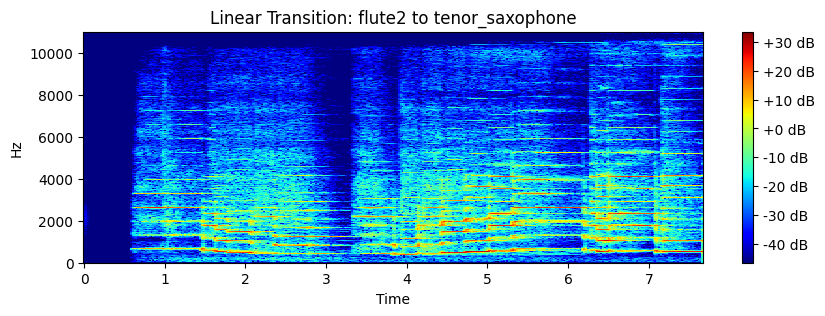

In [ ]:
instrument_1_type = 'flute2' #@param ['violin', 'flute', 'flute2', 'trumpet', 'tenor_saxophone']
instrument_2_type = 'tenor_saxophone' #@param ['violin', 'flute', 'flute2', 'trumpet', 'tenor_saxophone']

inst_1_model = tracker.get_instrument(instrument_1_type)
inst_2_model = tracker.get_instrument(instrument_2_type)

#sysnthesize inst 1 controls
aut_enc_1 = inst_1_model['ae']
processor_group_1 = inst_1_model['pg']

inst_1_controls = tracker.source_features.copy()
inst_1_controls = aut_enc_1.encode(inst_1_controls)
decode_1_controls = aut_enc_1.decoder(inst_1_controls)
inst_1_controls.update(decode_1_controls)

#sysnthesize inst 2 controls
aut_enc_2 = inst_2_model['ae']
processor_group_2 = inst_2_model['pg']

inst_2_controls = tracker.source_features.copy()
inst_2_controls = aut_enc_2.encode(inst_2_controls)
decode_2_controls = aut_enc_2.decoder(inst_2_controls)
inst_2_controls.update(decode_2_controls)

#Apply weights as before but evenly ajusted weighted sum of controls
#over the duration of the melody
time_steps = tracker.source_features['f0_hz'].shape[0]

scale = np.arange(1, step= 1/(time_steps))
scale = scale.reshape((1,-1,1))

amps_mod = scale*inst_2_controls['amps'] + (1-scale)*inst_1_controls['amps']
harm_mod = scale*inst_2_controls['harmonic_distribution']+ (1-scale)*inst_1_controls['harmonic_distribution']
noise_mod = scale*inst_2_controls['noise_magnitudes'] + (1-scale)*inst_1_controls['noise_magnitudes']

weighted_controls = {'amps':amps_mod,
              'harmonic_distribution':harm_mod,
              'noise_magnitudes':noise_mod,
              'f0_hz': inst_1_controls['f0_hz'] }

output = run_dag(weighted_controls, processor_group_1)
output_audio = output['out']['signal']

display(Audio(output_audio, rate=sample_rate))
spec_plot(output_audio.numpy(), sample_rate, title='Linear Transition: {0} to {1}'.format(instrument_1_type,instrument_2_type))

# Network Bending

The final method of creating instrument tones is network bending. As described in the helper function section on network bending, this method is based on the work in (Yee-King et al., 2021).

Network bending is performed by adjusting the intermediate values produced by the network that maps the input fundamental/loudness to the synthesizer parameters. Functions are applied these values before sending them to subsequent layers.

The first drop down controls the position within the network that the bending takes place. The second drop down controls the type of transformation that is applied to the activations. The strength parameter controls the strength of the effect, and the threshold parameter adjusts the threshold at which the threshold transformation is applied.

A more detailed explanation of the functions can be found in the helper function section on network bending.


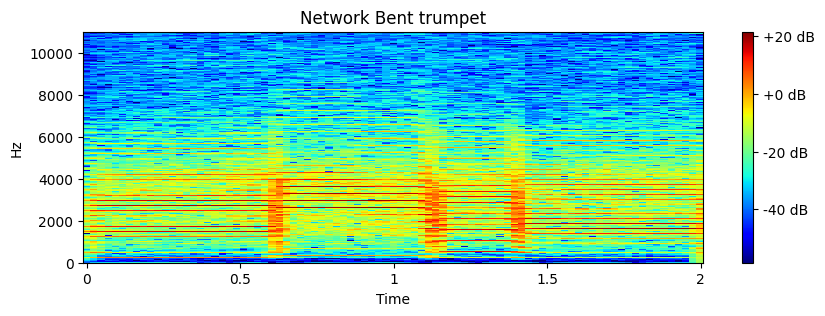

In [ ]:
instrument_type = 'trumpet' #@param ['violin', 'flute', 'flute2', 'trumpet', 'tenor_saxophone']

bend_position = '1' #@param ['1', '2', '3', '4', '5']
bend_type = 'invert' #@param ['ablate', 'invert', 'threshold']
strength = 1 #@param {type:"slider", min:1, max:100, step:1}
threshold = 100 #@param {type:"slider", min:1, max:100, step:1}
strength /= 100
threshold /= 100

model = tracker.get_instrument(instrument_type)

aut_enc = model['ae']
processor_group = model['pg']

inst_controls = tracker.source_features.copy()
inst_controls = aut_enc.encode(inst_controls)

#using decode_controls function to use networkbender
dec_controls = decode_controls(aut_enc.decoder
                               ,bend_position
                               ,bend_type
                               ,strength
                               ,threshold
                               ,inst_controls)

inst_controls.update(dec_controls)

output = run_dag(inst_controls, processor_group)
output_audio = output['out']['signal']

display(Audio(output_audio, rate=sample_rate))
spec_plot(output_audio.numpy(), sample_rate, title='Network Bent {}'.format(instrument_type))

In [ ]:
dec_controls.keys()

dict_keys(['amps', 'harmonic_distribution', 'noise_magnitudes'])

In [ ]:
import tensorflow
tensorflow.math.reduce_max(dec_controls['amps'])

<tf.Tensor: shape=(), dtype=float32, numpy=-2.1476166>

In [ ]:
#@markdown Run this block to save the tone in the prior cell.

setting_name = 'Network Bent Trumpet' #@param {type:"string"}

tracker.save_output(output, setting_name)

Output Saved: Network Bent Trumpet


# Mod Wheel

## Value Assignment

Now that we have created a set of sounds to modulate between, we can begin training the neural net that the "wheel" controls. The approach uses a simple three layered fully connected network that takes the fundamental, loudness, and a 0-1 valued input parameter as inputs. The network outputs the DSP parameters directly.

The goal is to learn a mapping from the dial position and audio features to set of values that control the tone of the output. Overfitting is not necessarily a problem as we are simply using the network as a means to navigate the higher dimension DSP parameter space.

In [ ]:
#@markdown A simple ui for each sound saved in tracker. **Adjust the slider and hit the confirm button to assign a value to the timbre.
#@markdown The delete button will remove the sound from the tracker.**
def create_assignment_ui(progress_tracker, sound):
  audio = progress_tracker.saved_outputs[sound]['out']['signal']

  print(sound)
  display(Audio(audio, rate=sample_rate))

  #slide controls parameter value corresponding to saved instrument tone
  slider = FloatSlider(
        value=0.5,
        min=0,
        max=1.0,
        step=0.01,
        description=sound,
        disabled=False,
        continuous_update=False,
        orientation='horizontal',
        readout=True,
        readout_format='.2f',
    )
  confirm_button = Button(description="Confirm Value")
  del_button = Button(description="Delete Audio")

  #on click, save parameter value to that position
  def confirm_click(b, key=sound):
    progress_tracker.saved_outputs[key]['dial'] = slider.value

    confirm_button.disabled = True
    del_button.disabled = True

  #remove tone from progress tracker
  def del_click(b, key=sound):
    _ = tracker.saved_outputs.pop(key)
    confirm_button.disabled = True
    del_button.disabled = True

  confirm_button.on_click(confirm_click)
  del_button.on_click(del_click)

  button_box = HBox([confirm_button, del_button])

  display(slider)
  display(button_box)


sounds = list(tracker.saved_outputs.keys())

#keeps references to dictionaries stored in tracker after running
for sound in sounds:
  create_assignment_ui(tracker, sound)

Basic Flute


FloatSlider(value=0.5, continuous_update=False, description='Basic Flute', max=1.0, step=0.01)

Violin Sax Hybrid


FloatSlider(value=0.5, continuous_update=False, description='Violin Sax Hybrid', max=1.0, step=0.01)

Network Bent Trumpet


FloatSlider(value=0.5, continuous_update=False, description='Network Bent Trumpet', max=1.0, step=0.01)

## Training

This section trains the neural network that the modulation wheel controls.

In [ ]:
#@markdown Formats the audio features, dial values, and dsp controls and creates data loaders for model I/O
X_store = []
y_store = []

for timbre_key in tracker.saved_outputs:
  timbre = tracker.saved_outputs[timbre_key]
  #inputs: fundamental, loundess, and dial value
  f0_scaled = timbre['f0_scaled'].numpy().squeeze(axis=0)
  ld_scaled = timbre['ld_scaled'].numpy().squeeze(axis=0)
  dial_val = timbre['dial']
  dial_ar = np.full(f0_scaled.shape, dial_val)

  #targets: harmonic, noise (AMP excluded)
  #note: as training data for google models doesnt necessarily
  #normalize db of instruments they are trained on
  #the models can have differences in loudness which is not timbral.
  #Additionally, amplitudes could effect the scale of the
  #harmonic distributions over frames which could impact timbre.

  #regardless, models struggle to learn 0 values in periods of silence so
  #using violin amplitude as substitute during synthesis

  harmonic = timbre['harmonic_distribution'].numpy().squeeze(axis=0)
  noise = timbre['noise_magnitudes'].numpy().squeeze(axis=0)
  #amps = timbre['amps'].numpy().squeeze(axis=0)

  timbre_X = np.concatenate((f0_scaled,ld_scaled, dial_ar),axis=1)
  timbre_y = np.concatenate((harmonic,noise),axis=1)
  #timbre_y = np.concatenate((amps,harmonic,noise),axis=1)

  X_store.append(timbre_X)
  y_store.append(timbre_y)

X = np.concatenate(X_store, axis=0)
y = np.concatenate(y_store, axis=0)

#create data loader
batch_size = 32
train_dataset = tf.data.Dataset.from_tensor_slices((X,y))
train_dataset = train_dataset.shuffle(buffer_size=512).batch(batch_size, drop_remainder=False)

In [ ]:
#@markdown Training a simple three layered fully connected network to learn produce the DSP controls.
#@markdown Each output neuron corresponds to the value of one of the controls.
#@markdown The MSE of the predicted controls is used as the loss function.

modulation_model = tfk.models.Sequential([
                    tfk.layers.Input(shape=(3,)),
                    tfk.layers.Dense(32, activation='relu'),
                    tfk.layers.Dense(64, activation='relu'),
                    tfk.layers.Dense(125, activation='linear')])

optimizer = tf.keras.optimizers.Adam(
    learning_rate=0.001,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-07
)

loss_fn = tfk.losses.MeanSquaredError()

epochs = 15 #@param {type:"integer"}

epoch_loss_min = 0.
best_weights = None

for epoch in range(epochs):
  print("\nStart of epoch %d" % (epoch,))
  epoch_loss = 0.
  for step, (x_batch_train, y_batch_train) in enumerate(train_dataset):
    with tf.GradientTape() as tape:
      outputs = modulation_model(x_batch_train, training=True)
      loss_value = loss_fn(y_batch_train, outputs)
    epoch_loss += loss_value
    grads = tape.gradient(loss_value, modulation_model.trainable_weights)

    optimizer.apply_gradients(zip(grads, modulation_model.trainable_weights))

  print("Training loss at epoch %d: %.4f" % (epoch, float(loss_value)))
  if epoch == 0 or epoch_loss < epoch_loss_min:
    epoch_loss_min = epoch_loss
    best_weights = modulation_model.get_weights()

if best_weights is not None:
  modulation_model.set_weights(best_weights)


# Playback

## Automating Modulation

In [ ]:
#@markdown Unfortunately, python and google colab's capacity for realtime audio playback is limited.
#@markdown This makes constructing an operable wheel on our timbral synthesizer difficult.
#@markdown To circumvent this limitation, we treat modulation in a similar way to automating a synthesizer dial in a digital audio workstation.
#@markdown The user draws lines that correspond to the position of a digital instrument parameter at a given point in time.

# @markdown Colab can be fairly limited in its agreeability to real-time user feedback.
# @markdown  This workaround uses a plotly dash that can be drawn on by clicking and dragging. The fundamental is displayed to provide a reference to the position of the timbre parameter and the note being played.
# @markdown  The clear lines button can be used to remove any lines you have entered. **Save your automation by hitting the 'Save Shapes button below the plot.**
# @markdown  **Parameter values are cleaned and quantized in the next cell, so don't worry if there are gaps or overlapping lines.**

#@markdown Different automation settings can be saved by changing the automation name below.

dial_automation_name = 'automation_name' #@param {type:"string"}

#@markdown It may take a few seconds for the visual to load after hitting run. The unaltered audio is displayed for reference

#save location for automation paths
automation_path = os.path.join('/content',dial_automation_name+ '.pkl')

#scales F0 on plot to scale of the parameter values (zero to one)
f0s = tracker.source_features['f0_hz']
f0s_min = np.min(f0s)
f0s_max = np.max(f0s)
f0s_scaled = (f0s-f0s_min)/(f0s_max - f0s_min)

N = f0s_scaled.shape[0]
audio_len = audio.shape[1]/sample_rate
t = np.linspace(0, audio_len, N)

#get names of the timbres and their positions on the dial
#used to plot instrument positions in relation input notes
timbre_names = []
timbre_parameter_values = []
for timbre in tracker.saved_outputs:
  timbre_names.append(timbre)
  timbre_parameter_values.append(tracker.saved_outputs[timbre]['dial'])

#create figure
fig = go.Figure()
#Adds plot of fundamentals
fig.add_trace(go.Scatter(x=t, y=f0s_scaled, mode='lines+markers', name='Fundamental (scaled)'))

#sets the settings of the plotly dash
fig.update_layout(
    title='Automation Drawing'
    ,xaxis_title='Time'
    ,yaxis_title='Timbre Parameter Position'
    ,showlegend=True
    ,dragmode='drawopenpath'
    ,newshape=dict(line_color='red')
    ,height=600
    ,xaxis=dict(
        range=[min(t), max(t)]  # Setting range from the minimum to maximum of time axis
    )
    ,yaxis=dict(
        range=[0, 1] # max and min of parameter values
        ,tickmode='array'
        ,tickvals=timbre_parameter_values
        ,ticktext=timbre_names
    )
)

#adds a button to clear user lines
fig.update_layout(
    updatemenus=[
        dict(
            type="buttons"
            ,showactive=True
            ,buttons=[
                dict(label="Clear Lines"
                     ,method="relayout"
                     ,args=[{"shapes": []}])
            ]
            ,direction="right"
            ,pad={"r": 10, "t": 10}
            ,x=0.2
            ,xanchor="left"
            ,y=1.2
            ,yanchor="top"
        )
    ]
)

#create dash app
app = dash.Dash(__name__)

#define dash layout
app.layout = html.Div([
                        dcc.Graph(id = "graph", className="graph", figure=fig),
                        html.Button("Save Shape Data", id = "shape-button"),
                        html.Div(id="text")
                    ])
#used to respond to click of the save shape data button
#saves parameters in a .pkl to be retrieved in the next cell
@app.callback(
    Output("text", "children"),
    Input("shape-button", "n_clicks"),
    Input("graph", "relayoutData"),
)
def on_shape_count_button_pressed(n_clicks, relayout_data):
  if n_clicks:
    shapes = relayout_data.get('shapes', []) if relayout_data else []
    with open(automation_path, 'wb') as file:
      pickle.dump(shapes, file)
    return 'Saved automation lines to {}'.format(automation_path)

  return dash.no_update

if __name__ == "__main__":
  display(Audio(audio, rate=sample_rate))
  app.run_server()

<IPython.core.display.Javascript object>

In [ ]:
#@markdown Now we quantize and clean the parameters before passing them into the model.
#@markdown **If you encounter any errors, please try re-running the cell above and re-saving the automation paths.** This is a workaround to some natural limitations of colab so its possible errors could pop up that didn't occur in testing.
with open(automation_path, 'rb') as file:
  parameter_lines = pickle.load(file)

t = np.linspace(0, audio_len, N)

#converts plotly path objects to set of sorted coordinates
param_cords = clean_paths(parameter_lines)

#split x and y values
time_vals = [pt[0] for pt in param_cords]
param_vals = [pt[1] for pt in param_cords]

#1d interpolation. 'nearest' was the most consistent in testing
interpolator = interp1d(time_vals
                        ,param_vals
                        ,kind='nearest'
                        ,fill_value='extrapolate')

intp_y_vals = interpolator(t)
#remove nan value
parameter_values = nan_to_num(intp_y_vals)

fig = go.Figure()
#Adds plot of fundamentals
fig.add_trace(go.Scatter(x=t, y=f0s_scaled, mode='lines+markers', name='Fundamental (scaled)'))
#Adds plot of qunatized parameter
fig.add_trace(go.Scatter(x=t, y=parameter_values, mode='lines+markers', name='Smoothed Parameter'))

#clean up graph
fig.update_layout(
    title='Quantized Automation'
    ,xaxis_title='Time'
    ,yaxis_title='Timbre Parameter Position'
    ,showlegend=True
    ,height=600
    ,xaxis=dict(
        range=[min(t), max(t)]  # Setting range from the minimum to maximum of time axis
    )
    ,yaxis=dict(
        range=[0, 1] # max and min of parameter values
        ,tickmode='array'
        ,tickvals=timbre_parameter_values
        ,ticktext=timbre_names
    )
)

fig.show()

## Output

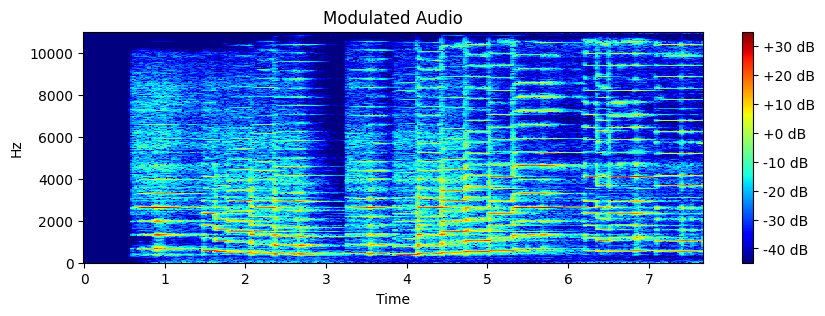

In [ ]:
#@markdown Now we can pass the audio features and quantized parameter into the model to hear the final result.
features = tracker.source_features.copy()

#produce controls necessary for final output

#ciolin model is called to get amplitude controls and scaled audio features
#Has additional effect of controlling reverb settings as it triggers .gin load
instrument_type = 'violin'
instrument_model = tracker.get_instrument(instrument_type)
aut_enc = instrument_model['ae']
processor_group = instrument_model['pg']

inst_controls = tracker.source_features.copy()
inst_controls = aut_enc.encode(inst_controls)
dec_controls = aut_enc.decoder(inst_controls)
inst_controls.update(dec_controls)

#get modulation model inputs
f0_in = inst_controls['f0_scaled'].numpy().reshape((-1,1))
ld_in = inst_controls['ld_scaled'].numpy().reshape((-1,1))
param_in = parameter_values.reshape((-1,1))

in_params = np.concatenate((f0_in, ld_in, param_in),axis=1)

#Get model ouputs and format
model_decoder_controls = modulation_model(in_params)

harmonic_controls = model_decoder_controls[:,0:60].numpy()
harmonic_controls = harmonic_controls.reshape(1,harmonic_controls.shape[0], harmonic_controls.shape[1])

noise_controls = model_decoder_controls[:,60:].numpy()
noise_controls = noise_controls.reshape(1, noise_controls.shape[0], noise_controls.shape[1])

modulated_controls = {'amps':inst_controls['amps'],
                  'harmonic_distribution':harmonic_controls,
                  'noise_magnitudes':noise_controls,
                  'f0_hz': inst_controls['f0_hz'] }

#synthesize audio using moulation model controls
output = run_dag(modulated_controls, processor_group)
output_audio = output['out']['signal']

display(Audio(output_audio, rate=sample_rate))
spec_plot(output_audio.numpy(), sample_rate, title='Modulated Audio')

Audio: Basic Flute


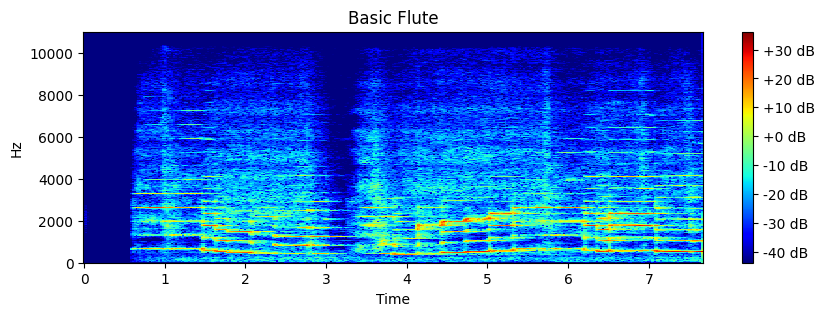

Audio: Violin Sax Hybrid


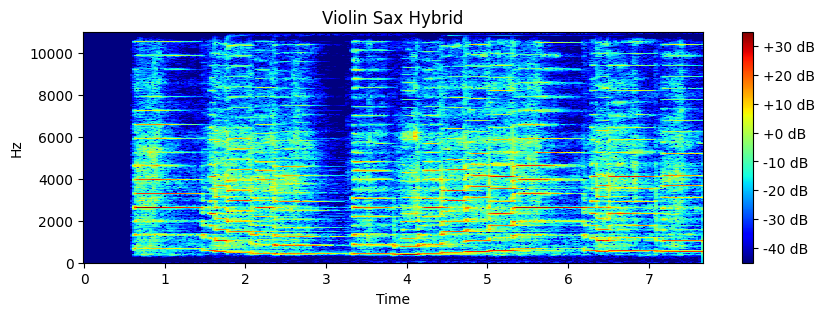

Audio: Network Bent Trumpet


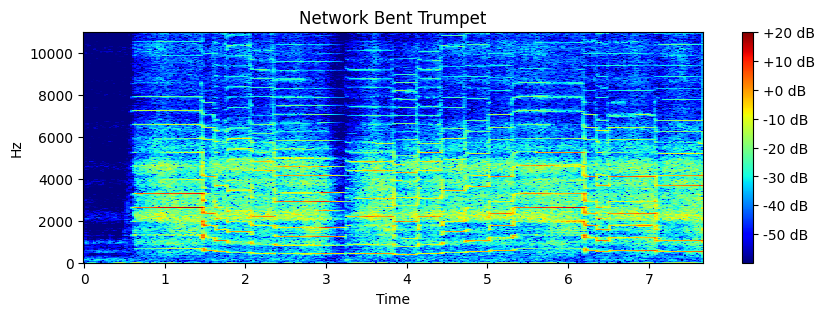

In [ ]:
#@markdown For comparison here are the original timbres and another plot of the quantized parameter values

for timbre in tracker.saved_outputs:
  reference_audio = tracker.saved_outputs[timbre]['out']['signal']
  print('Audio: {}'.format(timbre))
  display(Audio(reference_audio, rate=sample_rate))
  spec_plot(reference_audio.numpy(),sample_rate, title=timbre)


fig = go.Figure()
#Adds plot of fundamentals
fig.add_trace(go.Scatter(x=t
                         ,y=f0s_scaled
                         ,mode='lines+markers'
                         ,name='Fundamental (scaled)'))
#Adds plot of parameter
fig.add_trace(go.Scatter(x=t
                         ,y=parameter_values
                         ,mode='lines+markers'
                         ,name='Smoothed Parameter'))

fig.update_layout(
    title='Quantized Automation'
    ,xaxis_title='Time'
    ,yaxis_title='Timbre Parameter Position'
    ,showlegend=True
    ,height=600
    ,xaxis=dict(
        range=[min(t), max(t)]  # Setting range from the minimum to maximum of time axis
    )
    ,yaxis=dict(
        range=[0, 1] # max and min of parameter values
        ,tickmode='array'
        ,tickvals=timbre_parameter_values
        ,ticktext=timbre_names
    )
)

fig.show()

# Evaluation

## Support Functions

In [ ]:
#@markdown Function automating timbre synthesis using the three methods in the notebook

def get_output(tone_type, tracker, base_pg, seed_num=0):
  random.seed(seed_num)
  instruments = ['violin', 'flute', 'flute2', 'trumpet', 'tenor_saxophone']
  if tone_type == 'default':
    #randomly select one instrument
    inst_name = random.sample(instruments,1)[0]
    inst_model = tracker.get_instrument(inst_name)
    #synthesize output dict
    aut_enc = model['ae']
    processor_group = base_pg

    tracker.set_reverb('violin') #controlling reverb conditions
    inst_controls = tracker.source_features.copy()
    inst_controls = aut_enc.encode(inst_controls)
    dec_controls = aut_enc.decoder(inst_controls)
    inst_controls.update(dec_controls)

    output = run_dag(inst_controls, processor_group)
    return output

  elif tone_type == 'weight':
    #randomly select two instruments
    inst_names = random.sample(instruments,2)
    instrument_1_type = inst_names[0]
    instrument_2_type = inst_names[1]

    #randomly select weighting parameters
    amps = random.randint(0, 100)
    harmonic_distribution = random.randint(0, 100)
    noise_magnitude = random.randint(0, 100)

    amps /= 100
    harmonic_distribution /= 100
    noise_magnitude /= 100

    inst_1_model = tracker.get_instrument(instrument_1_type)
    inst_2_model = tracker.get_instrument(instrument_2_type)

    tracker.set_reverb('violin') #controlling reverb conditions

    #synthesize inst 1 controls
    aut_enc_1 = inst_1_model['ae']
    processor_group_1 = base_pg

    inst_1_controls = tracker.source_features.copy()
    inst_1_controls = aut_enc_1.encode(inst_1_controls)
    inst_1_dec_controls = aut_enc_1.decoder(inst_1_controls)
    inst_1_controls.update(inst_1_dec_controls)

    #synthesize inst 2 controls
    aut_enc_2 = inst_2_model['ae']
    processor_group_2 = base_pg

    inst_2_controls = tracker.source_features.copy()
    inst_2_controls = aut_enc_2.encode(inst_2_controls)
    inst_2_dec_controls = aut_enc_2.decoder(inst_2_controls)
    inst_2_controls.update(inst_2_dec_controls)

    #control weighting
    inst_1_amp_weight = 1 - amps

    inst_1_harm_weight = 1 - harmonic_distribution

    inst_1_noise_weight = 1 - noise_magnitude

    amps_weighted = (inst_1_amp_weight*inst_1_controls['amps']
                     + (1 - inst_1_amp_weight)*inst_2_controls['amps'])
    harm_weighted = (inst_1_harm_weight*inst_1_controls['harmonic_distribution']
                     + (1 - inst_1_harm_weight)*inst_2_controls['harmonic_distribution'])
    noise_weighted = (inst_1_noise_weight*inst_1_controls['noise_magnitudes']
                      + (1 - inst_1_noise_weight)*inst_2_controls['noise_magnitudes'])

    weighted_controls = {'amps':amps_weighted,
                  'harmonic_distribution':harm_weighted,
                  'noise_magnitudes':noise_weighted,
                  'f0_hz': inst_1_controls['f0_hz'] }
    #synthesize output dict
    output = run_dag(weighted_controls, processor_group_1)
    output.update({'f0_scaled':inst_1_controls['f0_scaled']
                   ,'ld_scaled':inst_1_controls['ld_scaled']})
    return output
  else:
    #randomly select an instrument
    inst_name = random.sample(instruments,1)[0]

    #randomly select bending parameters
    bend_position = random.sample(['1', '2', '3', '4', '5'],1)
    bend_type = random.sample(['ablate', 'invert', 'threshold'],1)
    strength = random.randint(1, 100)
    threshold = random.randint(0, 100)
    strength /= 100
    threshold /= 100

    #synthesize output
    model = tracker.get_instrument(inst_name)
    tracker.set_reverb('violin') #controlling reverb conditions

    aut_enc = model['ae']
    processor_group = base_pg

    inst_controls = tracker.source_features.copy()
    inst_controls = aut_enc.encode(inst_controls)

    dec_controls = decode_controls(aut_enc.decoder
                                   ,bend_position
                                   ,bend_type
                                   ,strength
                                   ,threshold
                                   ,inst_controls)

    inst_controls.update(dec_controls)

    output = run_dag(inst_controls, processor_group)
    return output

In [ ]:
#@markdown Function producing data loader
def get_data_loader(comp_dict):
  X_store = []
  y_store = []

  for timbre_key in comp_dict:
    timbre = comp_dict[timbre_key]
    #inputs: fundamental, loundess, and dial value
    f0_scaled = timbre['f0_scaled'].numpy().squeeze(axis=0)
    ld_scaled = timbre['ld_scaled'].numpy().squeeze(axis=0)
    dial_val = timbre['dial']
    dial_ar = np.full(f0_scaled.shape, dial_val)

    harmonic = timbre['harmonic_distribution'].numpy().squeeze(axis=0)
    noise = timbre['noise_magnitudes'].numpy().squeeze(axis=0)
    #amps = timbre['amps'].numpy().squeeze(axis=0)

    timbre_X = np.concatenate((f0_scaled,ld_scaled, dial_ar),axis=1)
    timbre_y = np.concatenate((harmonic,noise),axis=1)
    #timbre_y = np.concatenate((amps,harmonic,noise),axis=1)

    X_store.append(timbre_X)
    y_store.append(timbre_y)

  X = np.concatenate(X_store, axis=0)
  y = np.concatenate(y_store, axis=0)

  #create data loader
  batch_size = 32
  train_dataset = tf.data.Dataset.from_tensor_slices((X,y))
  train_dataset = train_dataset.shuffle(buffer_size=512).batch(batch_size, drop_remainder=False)
  return train_dataset

In [ ]:
#@markdown Model Training Loop

def train_model(comp_dict, epochs=15):
  train_dataset = get_data_loader(comp_dict)

  modulation_model = tfk.models.Sequential([
                      tfk.layers.Input(shape=(3,)),
                      tfk.layers.Dense(32, activation='relu'),
                      tfk.layers.Dense(64, activation='relu'),
                      tfk.layers.Dense(125, activation='linear')])

  optimizer = tf.keras.optimizers.Adam(
      learning_rate=0.001,
      beta_1=0.9,
      beta_2=0.999,
      epsilon=1e-07
  )

  loss_fn = tfk.losses.MeanSquaredError()

  epoch_loss_min = 0.
  best_weights = None

  for epoch in range(epochs):
    epoch_loss = 0.
    for step, (x_batch_train, y_batch_train) in enumerate(train_dataset):
      with tf.GradientTape() as tape:
        outputs = modulation_model(x_batch_train, training=True)
        loss_value = loss_fn(y_batch_train, outputs)

      epoch_loss += loss_value
      grads = tape.gradient(loss_value, modulation_model.trainable_weights)
      optimizer.apply_gradients(zip(grads, modulation_model.trainable_weights))

  if best_weights is not None:
    modulation_model.set_weights(best_weights)

  return modulation_model

## Evaluation Loop

The evaluation of the system is cented on measuring the the effect of using a neural model to traverse interpolated instument tones between instruments on the novelty of the tones produced.

Evaluation begins by selecting a pair of instruments tones and synthesized using a random selection of the parameters used throughout the workbook. The first instrument tone is set to position 0 on the dial and the second instrument is set to position 2. A modulation model is trained to represent the parameter used to transition from one instrument to another.

To asses novelty in the path finding, we consider the behavior of the spectral loss of the modulation model output compared to the instrument at position 0. The dial value is incrementally shifted and the loss values are plotted.

This plot is compared to the same measure applied to a simple linear transition in controls from instrument tone 1 to instrument tone 2. In this case, we would expect the spectral loss from the first instrument to increase linearly as the paraemters are shifted. If the nueral model finds a different path through the DSP parameter space, the plots should look different.

In [ ]:
tone_types = ['default', 'weight', 'bend']

#used to get the processor group necessary to generate sound
#Differences in processor groups between instruments only control reverb, so using violin.
#same reverb controls evaluation metric
pg_model = tracker.get_instrument('violin')
processor_group = pg_model['pg']

#Evaluation is based on multiscale spectral loss
spec_loss = losses.SpectralLoss()

comp_dict = {}
#randomly select comparison timbre type
tone_type_1 = random.sample(tone_types,1)
tone_type_2 = random.sample(tone_types,1)

comp_dict[0] = {'type':tone_type_1}
comp_dict[1] = {'type':tone_type_2}

#initilaize loss arrays
loss_dial_position = []
loss_linear = []
loss_mod = []

for tone in comp_dict:
  tone_type = comp_dict[tone]['type']
  #synthesizes controls and audio using random parameters for the randomly selected tone type
  output = get_output(tone_type, tracker, processor_group, tone)
  output['dial'] = tone
  comp_dict[tone].update(output)

inst_1_audio = comp_dict[0]['out']['signal']
inst_2_audio = comp_dict[1]['out']['signal']

display(Audio(inst_1_audio, rate=sample_rate))
display(Audio(inst_2_audio, rate=sample_rate))

#trains a modulation model with instrument one at position 0 and instrument 2 and position 1
modulation_model = train_model(comp_dict, epochs=15)

#loss measured in terms of first instrument sound
target_audio =comp_dict[0]['out']['signal']

#find differences between instrument parameters for linear shift
inst_1_controls = comp_dict[0]
inst_2_controls = comp_dict[1]

amps_dif = inst_1_controls['amps'] - inst_2_controls['amps']
harm_dif = inst_1_controls['harmonic_distribution'] - inst_2_controls['harmonic_distribution']
noise_dif = inst_1_controls['noise_magnitudes'] - inst_2_controls['noise_magnitudes']

for dial_index in range(0, 105,10):
  dial_position = float(dial_index/100.0)
  print('Dial Position: {}'.format(dial_position))

  #create parameters to synthesize audio for a simple linear transition
  #Shift controls from inst 1 to inst 2 by .05 at each iteration
  inst_1_controls = comp_dict[0]
  inst_2_controls = comp_dict[1]

  amps_shift = inst_1_controls['amps'] - dial_position*amps_dif
  harm_shift = inst_1_controls['harmonic_distribution'] - dial_position*harm_dif
  noise_shift = inst_1_controls['noise_magnitudes'] - dial_position*noise_dif

  linear_controls = {'amps':amps_shift,
                'harmonic_distribution':harm_shift,
                'noise_magnitudes':noise_shift,
                'f0_hz': inst_1_controls['f0_hz'] }

  output_linear = run_dag(linear_controls, processor_group)
  output_linear.update({'f0_scaled':inst_1_controls['f0_scaled'], 'ld_scaled':inst_1_controls['ld_scaled']})
  linear_audio = output_linear['out']['signal']

  #formats input data for model out and synthesizes audio
  f0_in = inst_2_controls['f0_scaled'].numpy().reshape((-1,1))
  ld_in = inst_2_controls['ld_scaled'].numpy().reshape((-1,1))
  frames = f0_in.shape[0]
  param_in = np.full((frames,1),dial_position )
  in_params = np.concatenate((f0_in, ld_in, param_in),axis=1)

  modulation_model_controls = modulation_model(in_params)

  harmonic_controls = modulation_model_controls[:,0:60].numpy()
  harmonic_controls = harmonic_controls.reshape(1,harmonic_controls.shape[0], harmonic_controls.shape[1])

  noise_controls = modulation_model_controls[:,60:].numpy()
  noise_controls = noise_controls.reshape(1, noise_controls.shape[0], noise_controls.shape[1])

  modulated_controls = {'amps':inst_1_controls['amps'], #again, using amps from inst 1 due to loudness normalization and modulation_models deficiancies in handling silence
                    'harmonic_distribution':harmonic_controls,
                    'noise_magnitudes':noise_controls,
                    'f0_hz': inst_1_controls['f0_hz'] }

  mod_output = run_dag(modulated_controls, processor_group)
  mod_audio = mod_output['out']['signal']

  print('Linear Shift')
  display(Audio(linear_audio, rate=sample_rate))
  print('Neural Modulation')
  display(Audio(mod_audio,rate=sample_rate))

  #calculate losses
  loss_dial_position.append(dial_position)

  linear_loss = tf.get_static_value(spec_loss(target_audio,linear_audio))
  mod_loss = tf.get_static_value(spec_loss(target_audio,mod_audio))

  loss_linear.append(linear_loss)
  loss_mod.append(mod_loss)


Dial Position: 0.0
Linear Shift


Neural Modulation


Dial Position: 0.1
Linear Shift


Neural Modulation


Dial Position: 0.2
Linear Shift


Neural Modulation


Dial Position: 0.3
Linear Shift


Neural Modulation


Dial Position: 0.4
Linear Shift


Neural Modulation


Dial Position: 0.5
Linear Shift


Neural Modulation


Dial Position: 0.6
Linear Shift


Neural Modulation


Dial Position: 0.7
Linear Shift


Neural Modulation


Dial Position: 0.8
Linear Shift


Neural Modulation


Dial Position: 0.9
Linear Shift


Neural Modulation


Dial Position: 1.0
Linear Shift


Neural Modulation


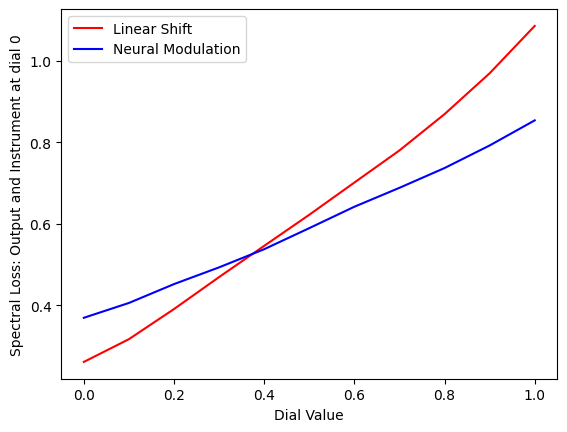

In [ ]:
fig, ax = plt.subplots()

color_1 = 'r'
color_2 = 'b'

ax.set_xlabel('Dial Value')
ax.set_ylabel('Spectral Loss: Output and Instrument at dial 0')
ax.plot(loss_dial_position, loss_linear, color=color_1, label = 'Linear Shift')
ax.plot(loss_dial_position, loss_mod, color=color_2, label = 'Neural Modulation' )
ax.legend()
